- dataset에는 A-Z 손글씨에 대한 188,958개의 사진
- 사진은 가로 28픽셀 * 세로 28픽셀
- 머신러닝 모형을 활용하여 A-Z 중 어떤 것인지 짐작
- 사진 데이터를 2차원 혹은 3차원으로 차원 축소한 후 저차원 상의 정보를 알맞게 군집하여 라벨을 파악하는 방식으로 접근하도록 한다.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pickle
with open('/content/drive/MyDrive/bigdata_deeplearning/final/data_open.pkl', 'rb') as f :
    images = pickle.load(f)

In [310]:
len(images)

188958

In [ ]:
images[0].size

(28, 28)

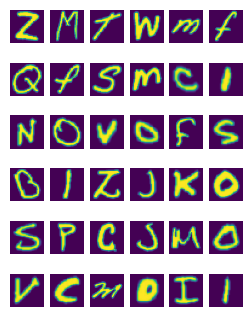

In [ ]:
# 첫 12개의 이미지 출력
plt.figure(figsize = (3,4))
for i in range(36):
  plt.subplot(6, 6, i+1)
  plt.imshow(images[i])
  plt.axis("off")

# 이미지 데이터 전처리


ndarray로 변경 (188958, 28, 28)

In [ ]:
image_arr = [np.array(image) for image in images]
stacked_arr = np.stack(image_arr)
stacked_arr.shape

(188958, 28, 28)

In [ ]:
type(stacked_arr)

numpy.ndarray

clustering은 데이터의 패턴과 구조를 이해하고 군집 형성이 목적이기 때문에 train, test set을 구분하지 않는다.


In [ ]:
# 시간의 제약상: 일단 만 개
train_num = 10000
X_mini = stacked_arr[:train_num]
X_train = stacked_arr

X_mini.shape, X_train.shape

((10000, 28, 28), (188958, 28, 28))

In [ ]:
x_mini = X_mini.astype('float32')/255.
x_train = X_train.astype('float32')/255.   # 정규화
print(x_mini.shape, x_train.shape)

(10000, 28, 28) (188958, 28, 28)


In [ ]:
x_mini = x_mini.reshape((len(x_mini), np.prod(x_mini.shape[1:])))
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:]))) # 평면화
print (x_mini.shape, x_train.shape)

(10000, 784) (188958, 784)


### 시각화


In [ ]:
# t-SNE를 이용한 시각화
from sklearn.manifold import TSNE
import time

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(x_train)
print("tsne done! time elasped: {}seconds".format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.016s...
[t-SNE] Computed neighbors for 10000 samples in 9.597s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.470918
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.272057
[t-SNE] KL divergence after 300 iterations: 2.962917
tsne done! time elasped: 

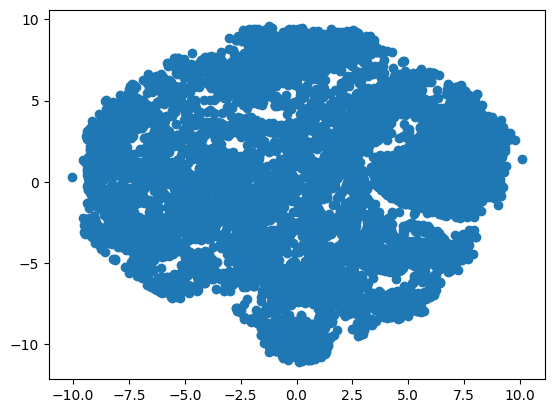

In [ ]:
import matplotlib.pyplot as plt

x_tsne = tsne_results[:, 0]
y_tsne = tsne_results[:, 1]

plt.scatter(x_tsne, y_tsne)
plt.show()

In [ ]:
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(x_train)
print("tsne done! time elasped: {}seconds".format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.014s...
[t-SNE] Computed neighbors for 10000 samples in 12.269s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.470918
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.402573
[t-SNE] KL divergence after 300 iterations: 2.837194
tsne done! time elasped:

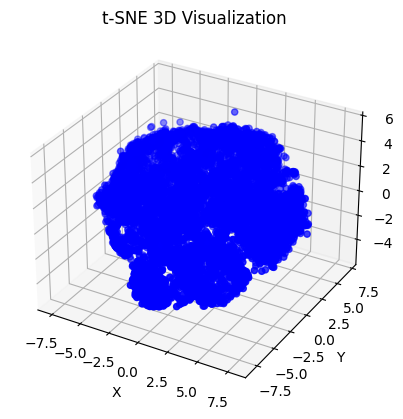

In [ ]:
import matplotlib.cm as cm
x_tsne = tsne_results[:, 0]
y_tsne = tsne_results[:, 1]
z_tsne = tsne_results[:, 2]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_tsne, y_tsne, z_tsne, c='b', marker='o')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.title('t-SNE 3D Visualization')
plt.show()

# Clustering

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, DBSCAN
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
## 가로로 10개의 이미지는 하나의 클러스터로 본 것.
def viz_img(y_pred, n, k):
  fig = plt.figure(1)
  box_index = 1
  for cluster in range(k):
    result = np.where(y_pred == cluster)
    for i in np.random.choice(result[0].tolist(), n, replace=False):
      ax = fig.add_subplot(n, n, box_index)
      plt.imshow(x_train[i].reshape(28, 28))
      plt.gray()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      box_index += 1
  plt.show()

### 1. PCA + K-means


주성분 2개

In [ ]:
pca2 = PCA(n_components=2)
reduced_x2 = pca2.fit_transform(x_mini)

n_clusters = [i for i in range(10, 27)]
for n_cluster in n_clusters:
  kmeans = KMeans(n_clusters=n_cluster,n_init=10, random_state=42)
  kmeans_result = kmeans.fit_predict(reduced_x2)
  labels = kmeans.labels_
  print(n_cluster, "개의 클러스터 사용 실루엣계수:" , silhouette_score(reduced_x2, labels))

10 개의 클러스터 사용 실루엣계수: 0.3460486
11 개의 클러스터 사용 실루엣계수: 0.34660327
12 개의 클러스터 사용 실루엣계수: 0.34999758
13 개의 클러스터 사용 실루엣계수: 0.3474738
14 개의 클러스터 사용 실루엣계수: 0.34451705
15 개의 클러스터 사용 실루엣계수: 0.34112948
16 개의 클러스터 사용 실루엣계수: 0.33878934
17 개의 클러스터 사용 실루엣계수: 0.33932656
18 개의 클러스터 사용 실루엣계수: 0.3400061
19 개의 클러스터 사용 실루엣계수: 0.33568427
20 개의 클러스터 사용 실루엣계수: 0.3335023
21 개의 클러스터 사용 실루엣계수: 0.33099708
22 개의 클러스터 사용 실루엣계수: 0.3258107
23 개의 클러스터 사용 실루엣계수: 0.32753897
24 개의 클러스터 사용 실루엣계수: 0.32947642
25 개의 클러스터 사용 실루엣계수: 0.32716787
26 개의 클러스터 사용 실루엣계수: 0.32627523


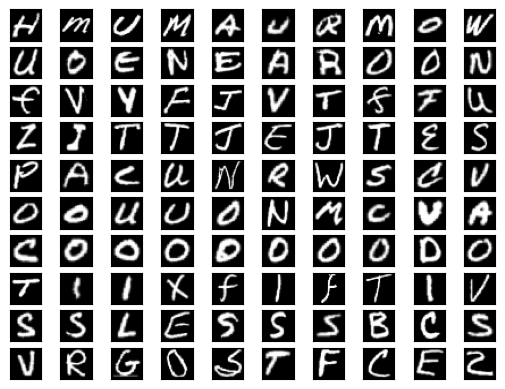

In [312]:
pca2 = PCA(n_components=2)
reduced_x2 = pca2.fit_transform(x_train)
kmeans2 = KMeans(n_clusters=12, n_init=10, random_state=42)
kmeans2_result = kmeans2.fit_predict(reduced_x2)
labels = kmeans2.labels_
viz_img(kmeans2.labels_, n=10, k=10)

주성분 3개

In [ ]:
pca3 = PCA(n_components=3)
reduced_x3 = pca3.fit_transform(x_mini)

n_clusters = [i for i in range(10, 27)]
for n_cluster in n_clusters:
  kmeans = KMeans(n_clusters=n_cluster,n_init=10, random_state=42)
  kmeans_result = kmeans.fit_predict(reduced_x3)
  labels = kmeans.labels_
  print(n_cluster, "개의 클러스터 사용 실루엣계수:" , silhouette_score(reduced_x3, labels))

10 개의 클러스터 사용 실루엣계수: 0.2635562
11 개의 클러스터 사용 실루엣계수: 0.2678954
12 개의 클러스터 사용 실루엣계수: 0.26202577
13 개의 클러스터 사용 실루엣계수: 0.263654
14 개의 클러스터 사용 실루엣계수: 0.25934002
15 개의 클러스터 사용 실루엣계수: 0.25901854
16 개의 클러스터 사용 실루엣계수: 0.25656033
17 개의 클러스터 사용 실루엣계수: 0.25459284
18 개의 클러스터 사용 실루엣계수: 0.25424933
19 개의 클러스터 사용 실루엣계수: 0.2548729
20 개의 클러스터 사용 실루엣계수: 0.25127852
21 개의 클러스터 사용 실루엣계수: 0.24978742
22 개의 클러스터 사용 실루엣계수: 0.24849455
23 개의 클러스터 사용 실루엣계수: 0.23459895
24 개의 클러스터 사용 실루엣계수: 0.25112778
25 개의 클러스터 사용 실루엣계수: 0.23632242
26 개의 클러스터 사용 실루엣계수: 0.23969615


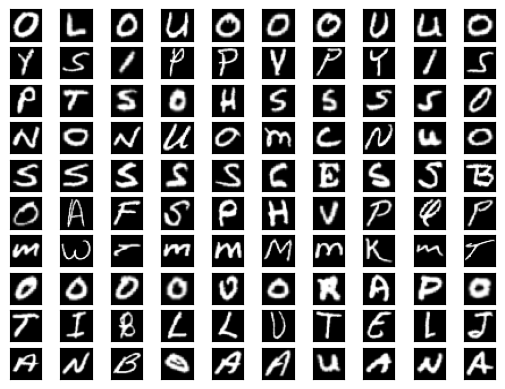

In [ ]:
pca3 = PCA(n_components=3)
reduced_x3 = pca3.fit_transform(x_train)
kmeans3 = KMeans(n_clusters=11, n_init=10, random_state=42)
kmeans3_result = kmeans3.fit_predict(reduced_x3)
labels = kmeans3.labels_

viz_img(kmeans3.labels_, n=10, k=10)

실루엣 계수로는 주성분 2개가 낫지만 몇 개의 알파벳을 제외하고 잘 클러스터링 하는지 모르겠다.


In [ ]:
cluster_indices = {}
for i, cluster_label in enumerate(kmeans2_result):
    if cluster_label not in cluster_indices:
        cluster_indices[cluster_label] = []
    cluster_indices[cluster_label].append(i)

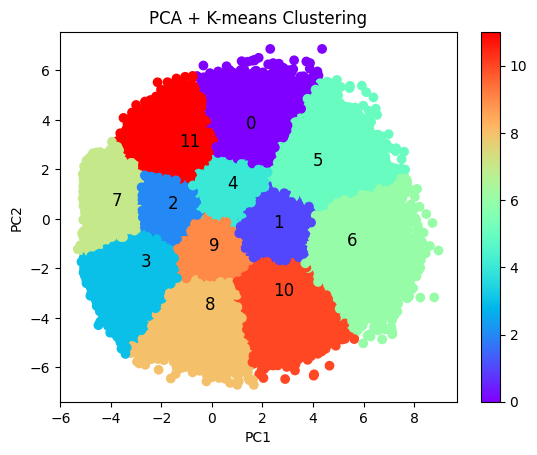

In [ ]:
# 결과 시각화
plt.scatter(reduced_x2[:, 0], reduced_x2[:, 1], c=kmeans2_result, cmap="rainbow")
plt.title('PCA + K-means Clustering')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar()

unique_clusters = np.unique(kmeans2_result)
for cluster in unique_clusters:
    cluster_center = kmeans2.cluster_centers_[cluster]
    plt.text(cluster_center[0], cluster_center[1], str(cluster), fontsize=12, color='black')

plt.show()

In [ ]:
# 각 cluster의 이미지 보기
def image_show(w, n, size, r, c):
  '''
  size  출력 개수(행*열)
  r     행
  c     열
  n     n번째 클러스터
  w     어디서
  '''
  cluster_1_indices = np.where(w == n)[0]
  # selected_images = x_train[cluster_1_indices]
  selected_indices = np.random.choice(cluster_1_indices, size=size, replace=False)
  selected_images = x_train[selected_indices]

  fig, axes = plt.subplots(r, c, figsize=(4, 4))
  fig.suptitle("Images from Cluster n ", fontsize=14)

  for i, ax in enumerate(axes.flat):
      ax.imshow(selected_images[i].reshape(28,28), cmap='gray')
      ax.axis('off')

  plt.tight_layout()
  plt.show()

### 2. pca + t-SNE + DBSCAN

x_mini

In [ ]:
pca50 = PCA(n_components=50)
X_pca50 = pca50.fit_transform(x_mini)

tsne2 = TSNE(n_components=2)
X_tsne2 = tsne2.fit_transform(X_pca50)

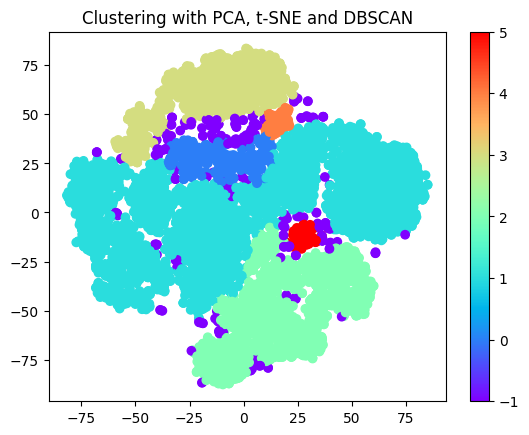

4.5 30


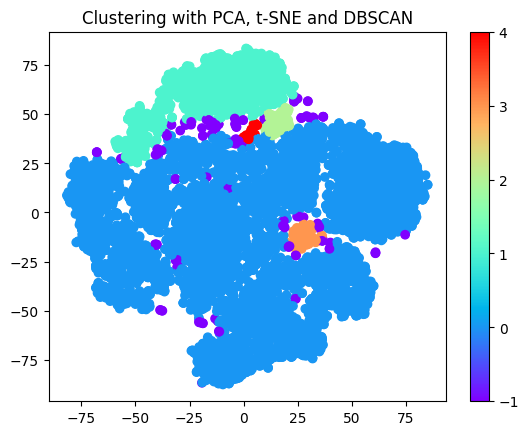

4.7 30


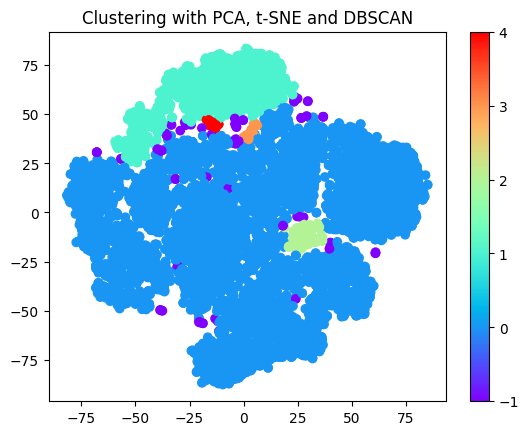

4.9 30


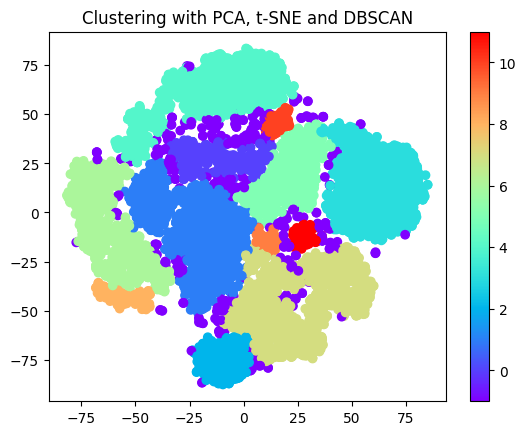

4.5 35


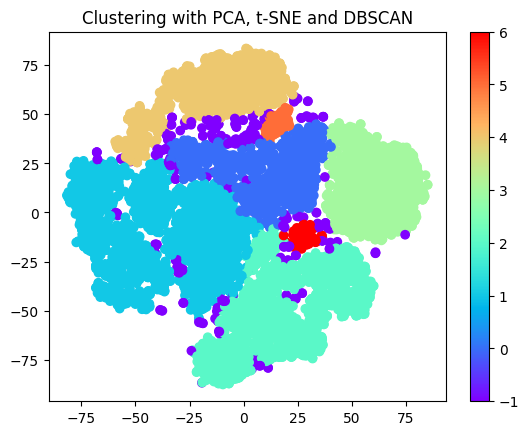

4.7 35


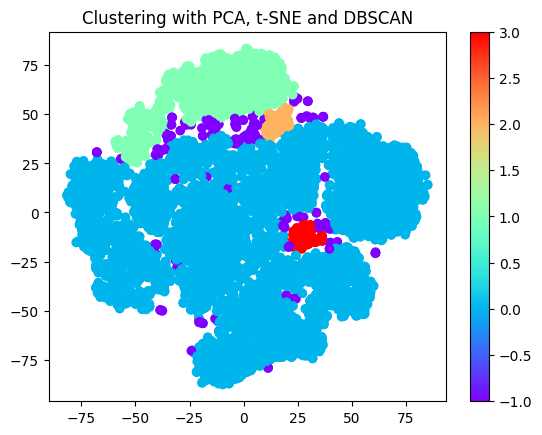

4.9 35


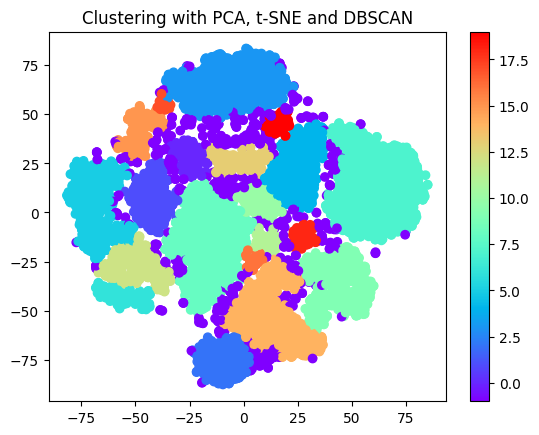

4.5 40


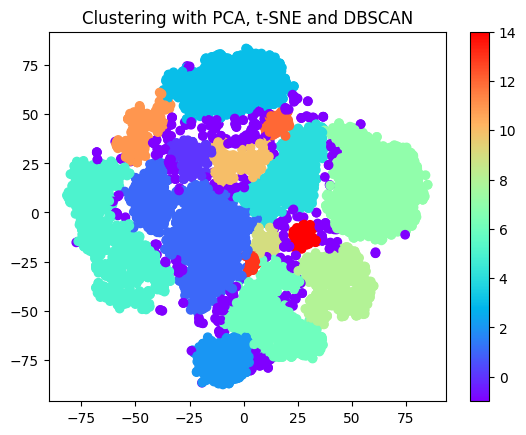

4.7 40


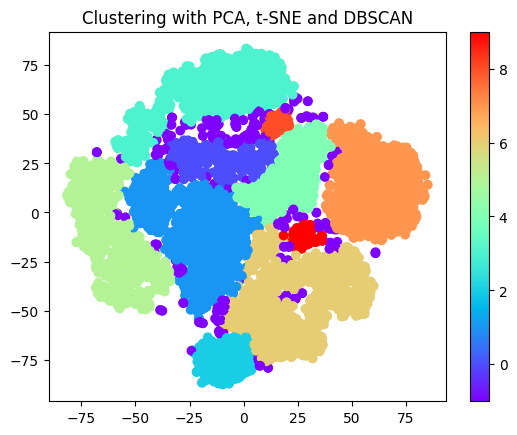

4.9 40


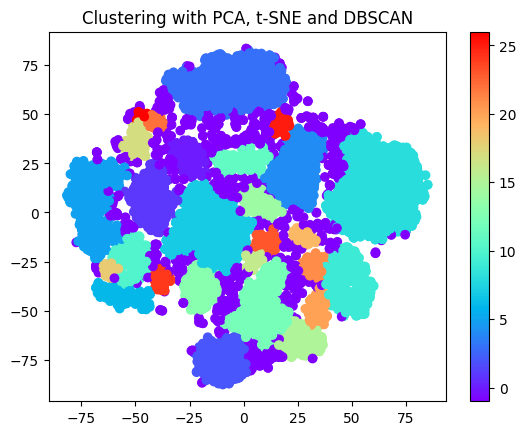

4.5 45


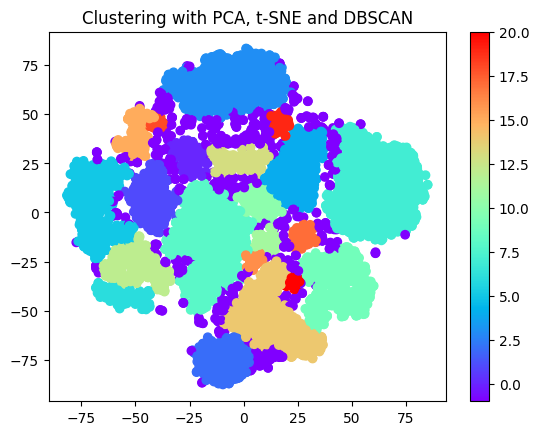

4.7 45


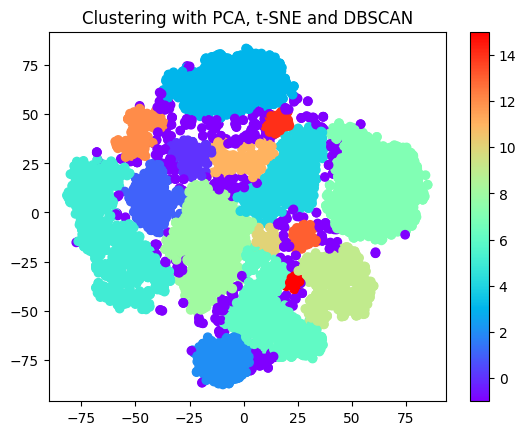

4.9 45


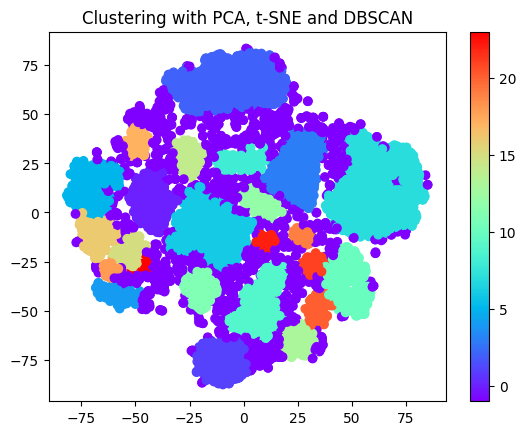

4.5 50


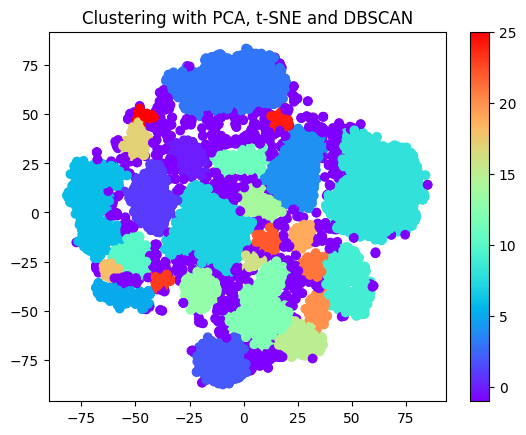

4.7 50


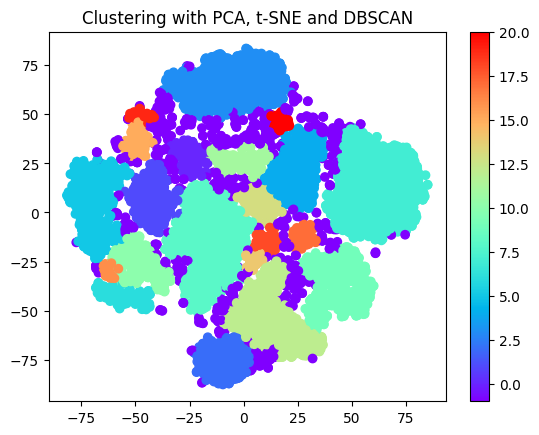

4.9 50


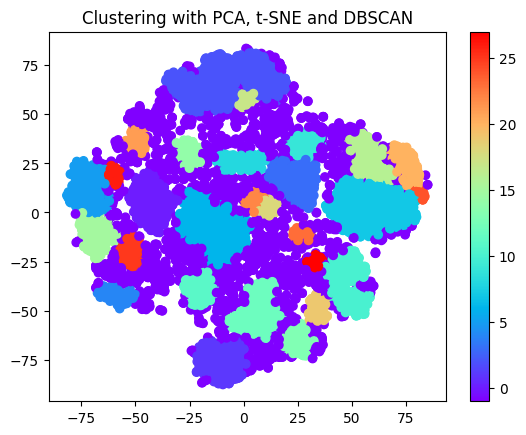

4.5 55


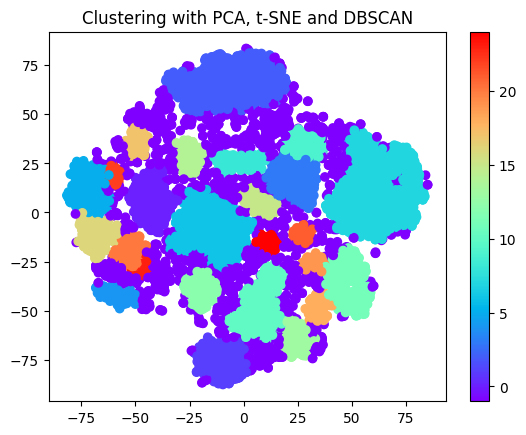

4.7 55


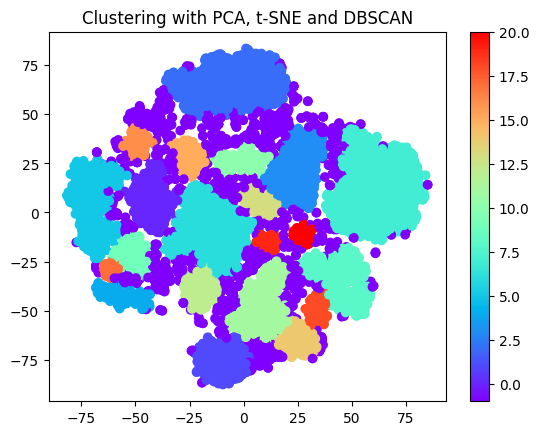

4.9 55


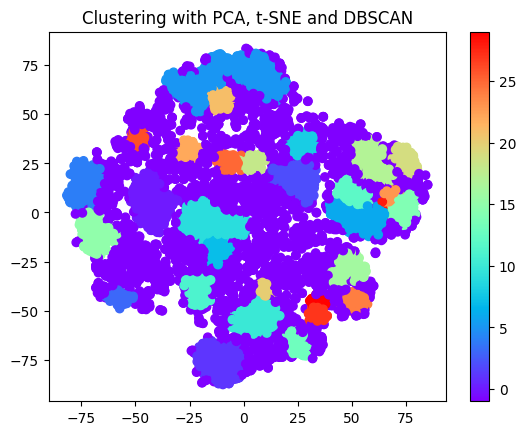

4.5 60


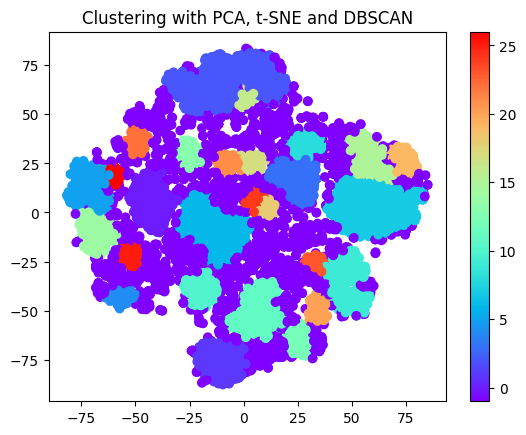

4.7 60


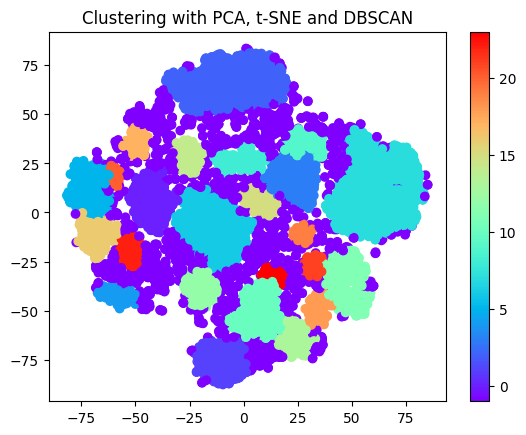

4.9 60


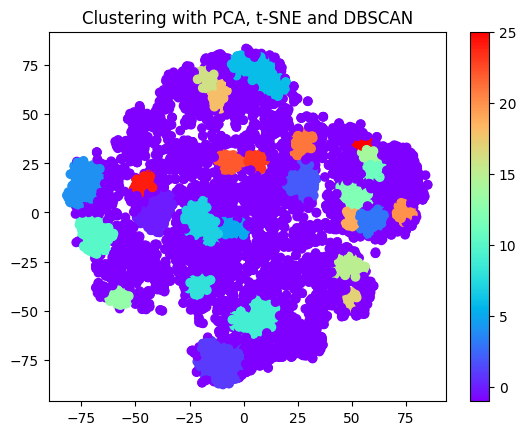

4.5 65


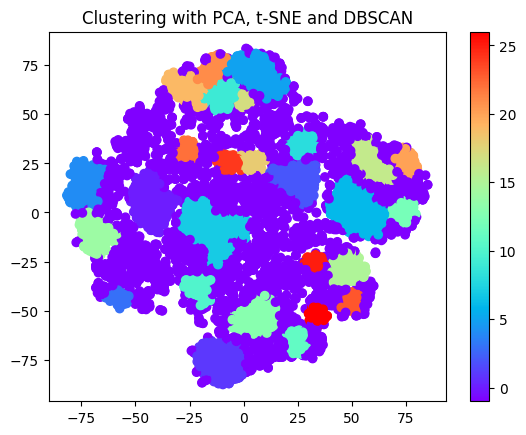

4.7 65


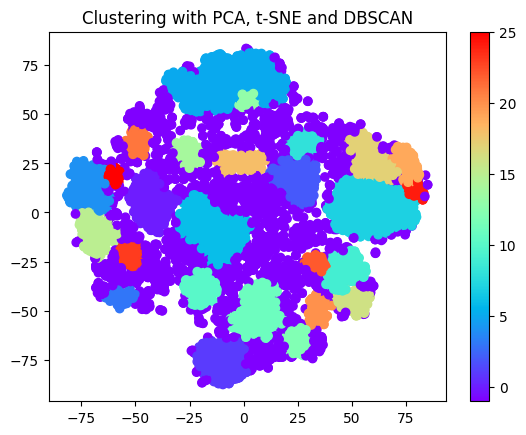

4.9 65


In [ ]:
eps = [round(i,1) for i in np.arange(4.5, 5, 0.2)]
min_samples = [k for k in range(30, 70, 5)]

for k in min_samples:
  for i in eps:
    dbscan2 = DBSCAN(eps=i, min_samples=k)
    dbscan2_result = dbscan2.fit_predict(X_tsne2)
    plt.scatter(X_tsne2[:, 0], X_tsne2[:, 1], c=dbscan2_result, cmap='rainbow')
    plt.title('Clustering with PCA, t-SNE and DBSCAN')
    plt.colorbar()
    plt.show()
    print(i, k)

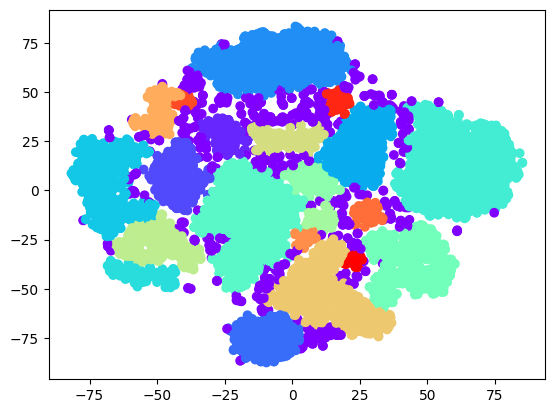

In [ ]:
i = 4.7; k = 45
dbscan2 = DBSCAN(eps=i, min_samples=k)
dbscan2_result = dbscan2.fit_predict(X_tsne2)
plt.scatter(X_tsne2[:, 0], X_tsne2[:, 1], c=dbscan2_result, cmap='rainbow')

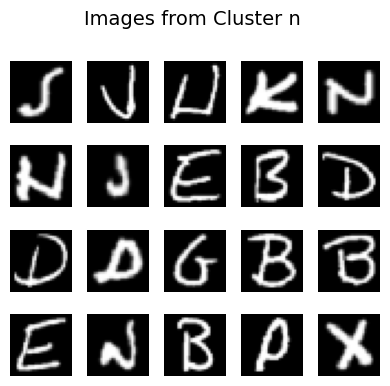

-1


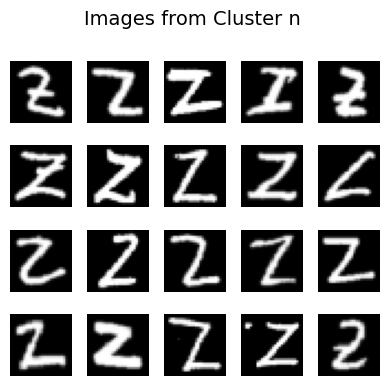

0


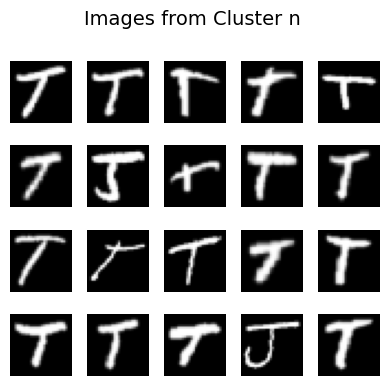

1


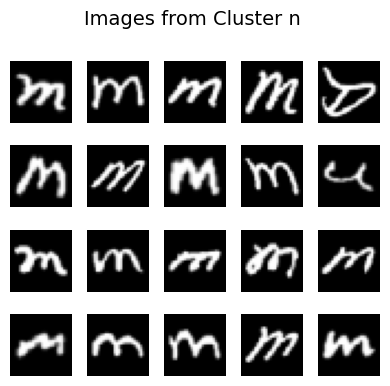

2


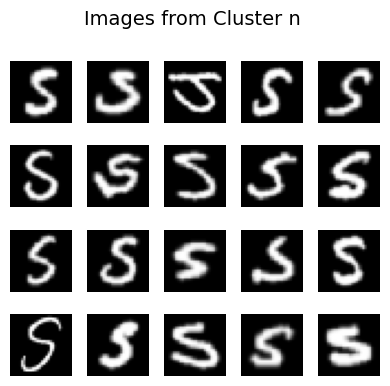

3


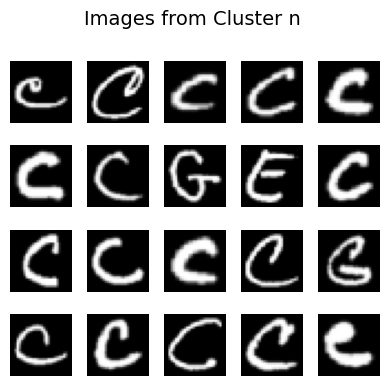

4


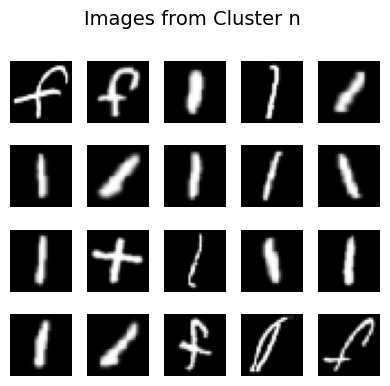

5


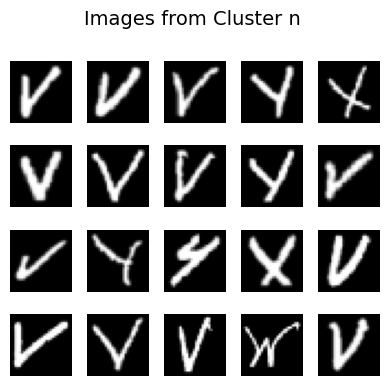

6


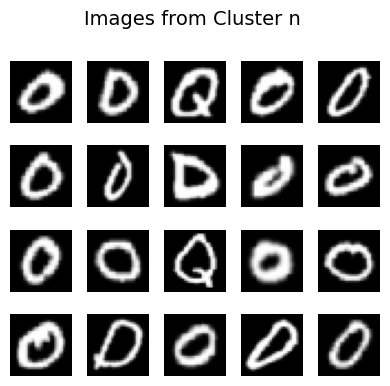

7


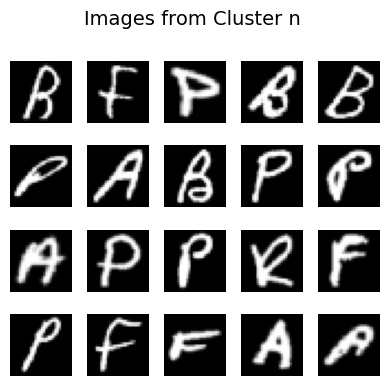

8


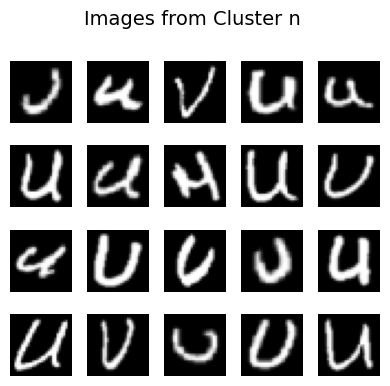

9


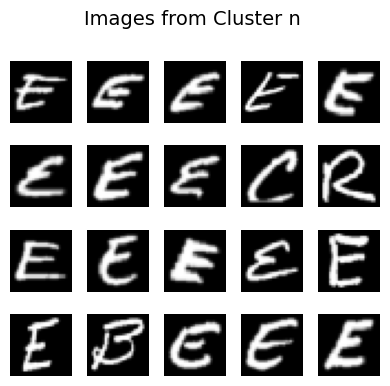

10


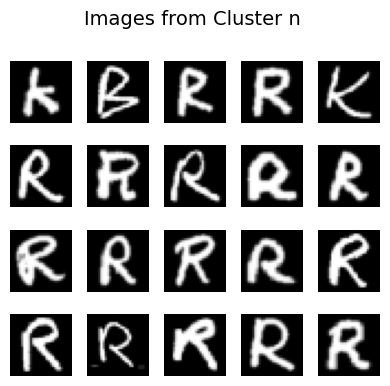

11


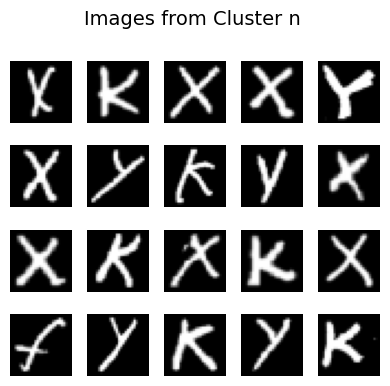

12


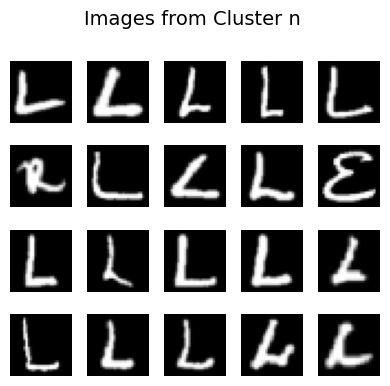

13


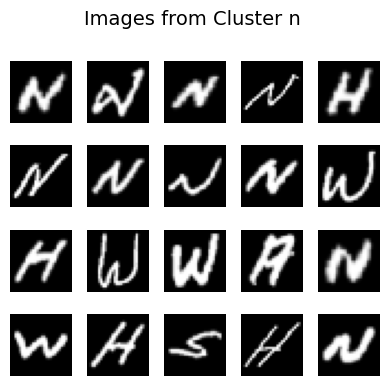

14


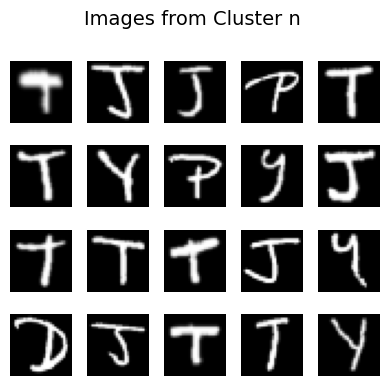

15


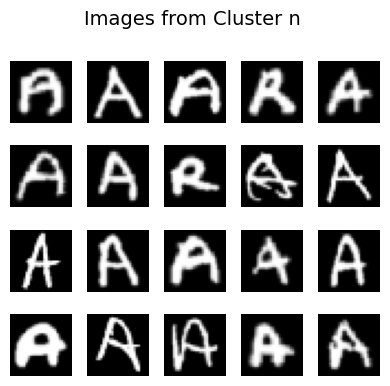

16


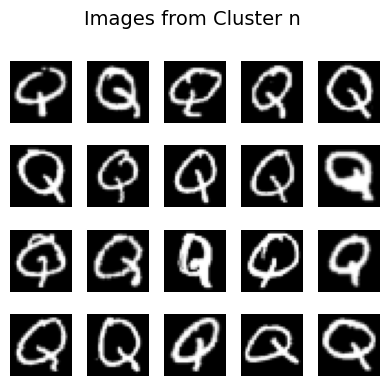

17


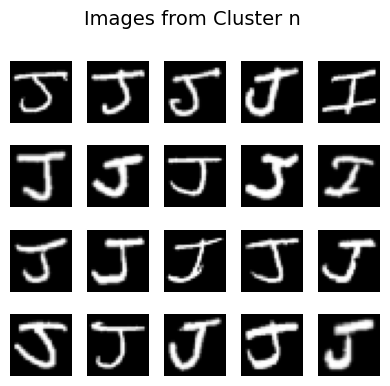

18


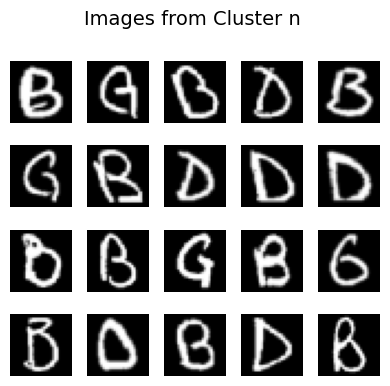

19


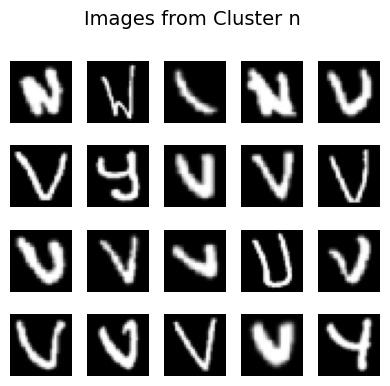

20


In [ ]:
n = [i for i in range(-1, 21)]
for i in n:
  image_show(w=dbscan2_result, n=i, size=20, r=4, c=5)
  print(i)

In [ ]:
# -1은 이상치를 의미함.
unique_elements = np.unique(dbscan2_result)
num_unique_elements = len(unique_elements)

print("Unique elements:", unique_elements)
print("Number of unique elements:", num_unique_elements)

Unique elements: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
Number of unique elements: 22


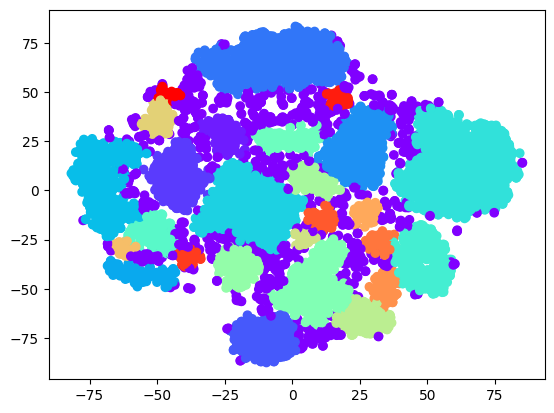

In [ ]:
i = 4.7; k = 50
dbscan2 = DBSCAN(eps=i, min_samples=k)
dbscan2_result = dbscan2.fit_predict(X_tsne2)
plt.scatter(X_tsne2[:, 0], X_tsne2[:, 1], c=dbscan2_result, cmap='rainbow')

In [ ]:
unique_elements = np.unique(dbscan2_result)
num_unique_elements = len(unique_elements)
print("Unique elements:", unique_elements)
print("Number of unique elements:", num_unique_elements)

Unique elements: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25]
Number of unique elements: 27


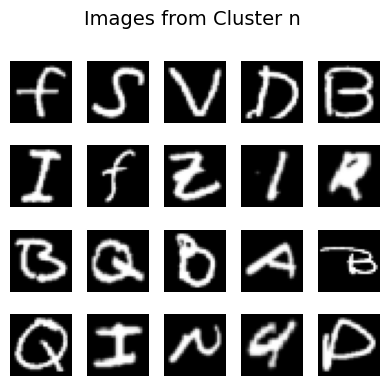

-1


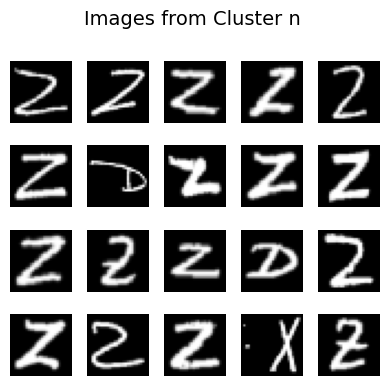

0


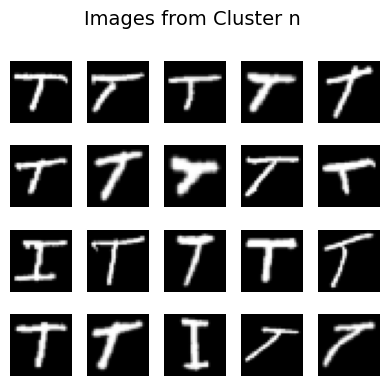

1


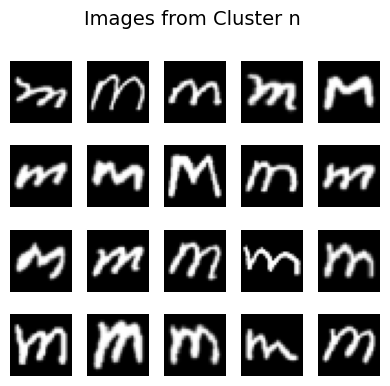

2


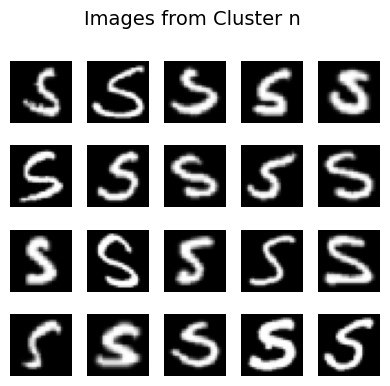

3


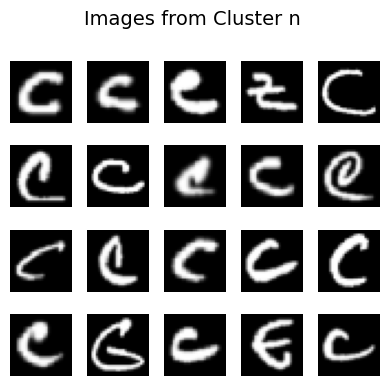

4


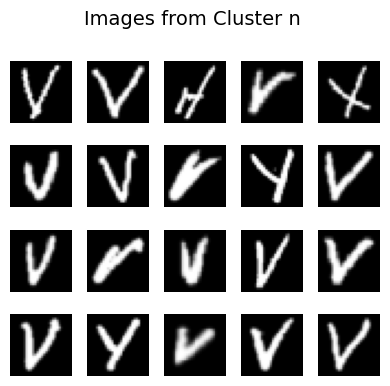

5


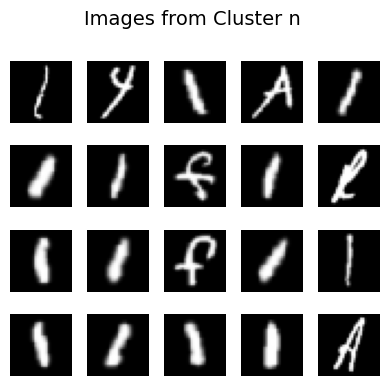

6


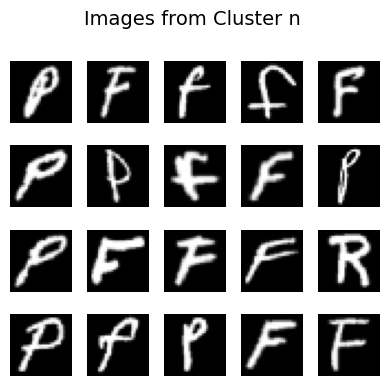

7


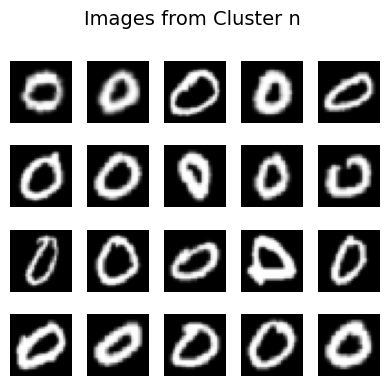

8


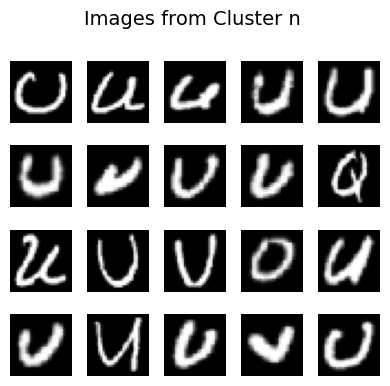

9


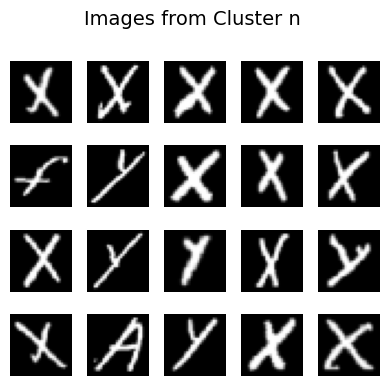

10


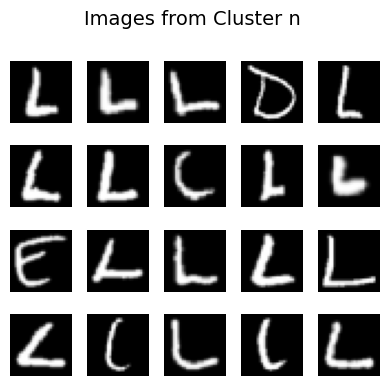

11


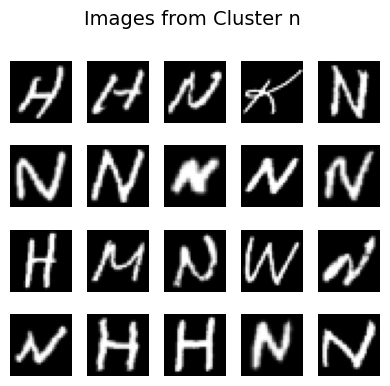

12


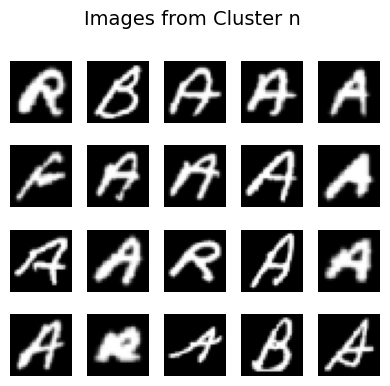

13


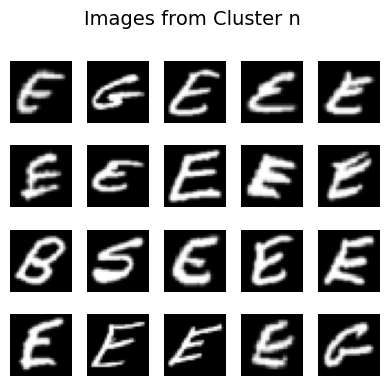

14


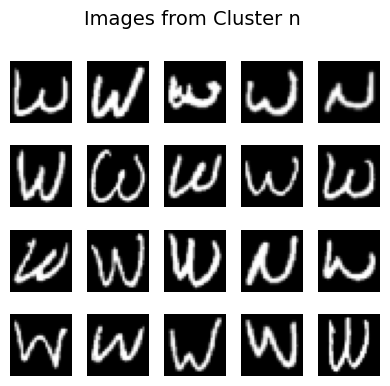

15


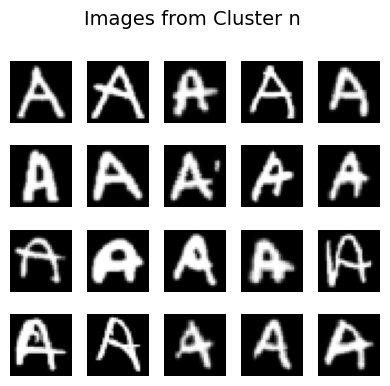

16


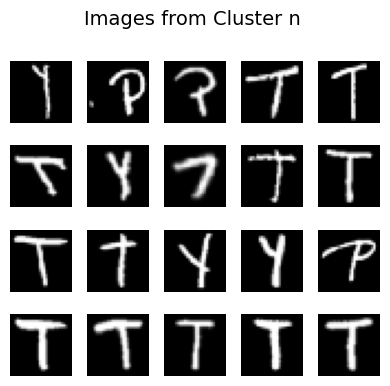

17


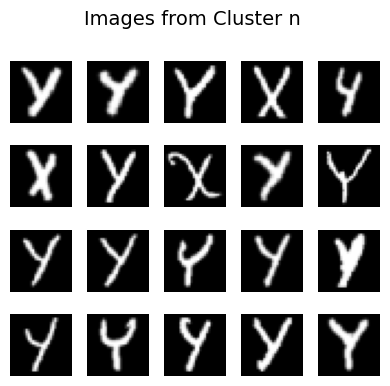

18


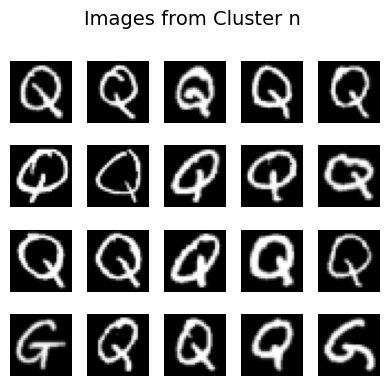

19


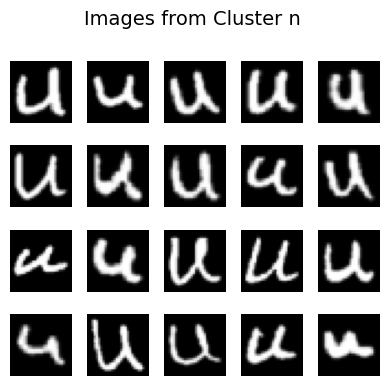

20


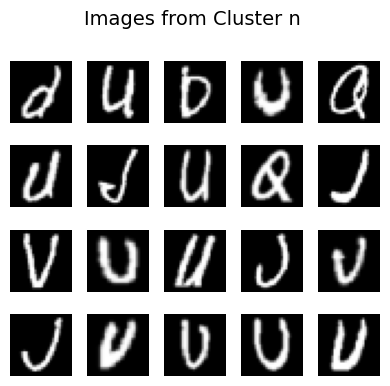

21


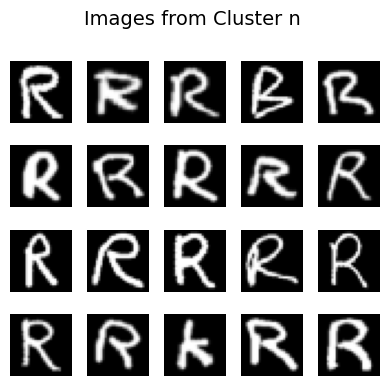

22


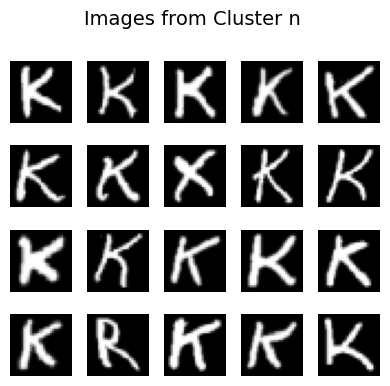

23


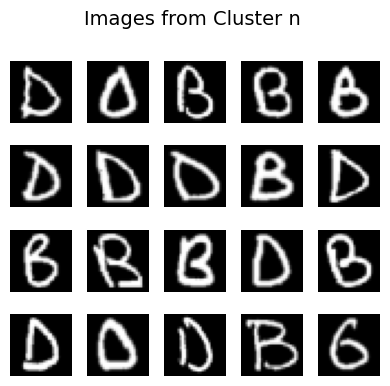

24


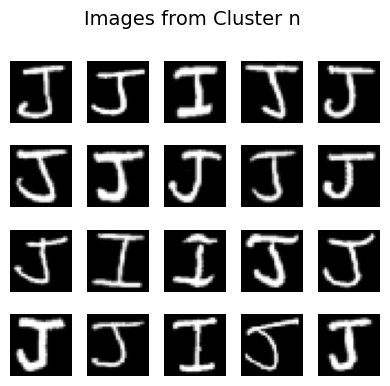

25


In [ ]:
n = [i for i in range(-1, 26)]
for i in n:
  image_show(w=dbscan2_result, n=i, size=20, r=4, c=5)
  print(i)

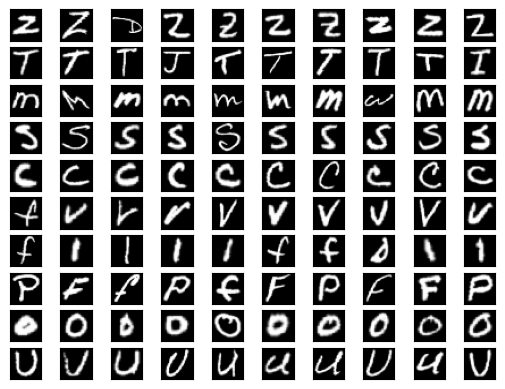

In [ ]:
viz_img(dbscan2_result, 10, 10)

x_train

In [ ]:
pca50 = PCA(n_components=50)
X_pca50t = pca50.fit_transform(x_train)

In [ ]:
tsne2 = TSNE(n_components=2)
X_tsne2t = tsne2.fit_transform(X_pca50t)

In [214]:
dbscan2t = DBSCAN(eps=4.8, min_samples=100)
dbscan2t_result = dbscan2t.fit_predict(X_tsne2t)

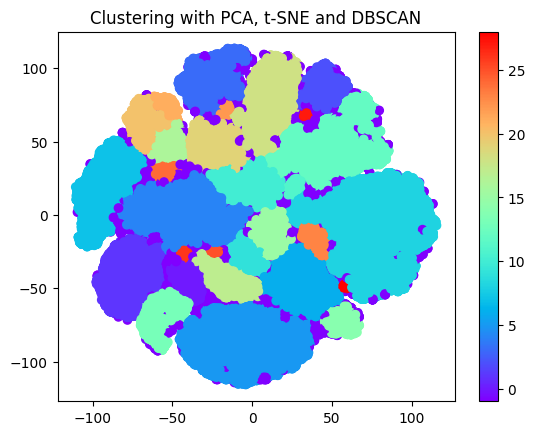

2.4 100
Unique elements: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28]
Number of unique elements: 30


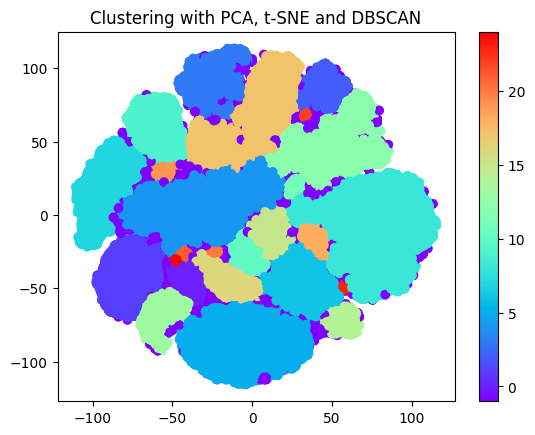

2.5 100
Unique elements: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24]
Number of unique elements: 26


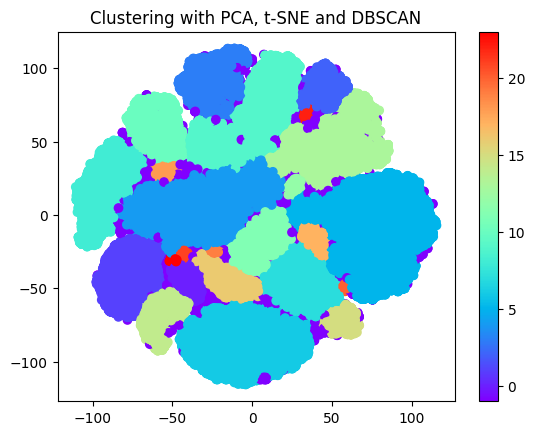

2.6 100
Unique elements: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23]
Number of unique elements: 25


In [230]:
eps = [2.4, 2.5, 2.6]
min_samples = [100]

for k in min_samples:
  for i in eps:
    dbscan2t = DBSCAN(eps=i, min_samples=k)
    dbscan2t_result = dbscan2t.fit_predict(X_tsne2t)
    plt.scatter(X_tsne2t[:, 0], X_tsne2t[:, 1], c=dbscan2t_result, cmap='rainbow')
    plt.title('Clustering with PCA, t-SNE and DBSCAN')
    plt.colorbar()
    plt.show()
    print(i, k)
    unique_elements = np.unique(dbscan2t_result)
    num_unique_elements = len(unique_elements)
    print("Unique elements:", unique_elements)
    print("Number of unique elements:", num_unique_elements)

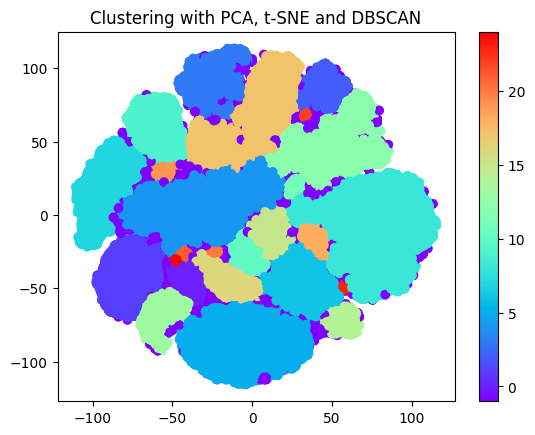

2.5 100


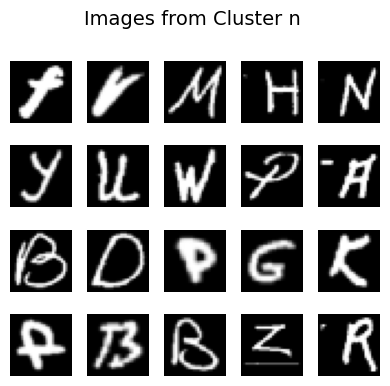

-1


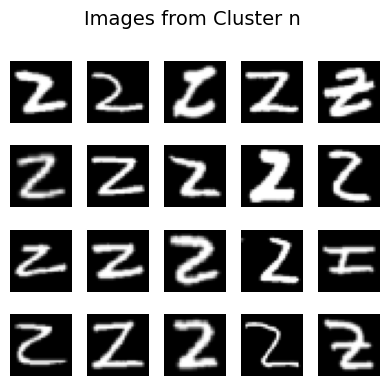

0


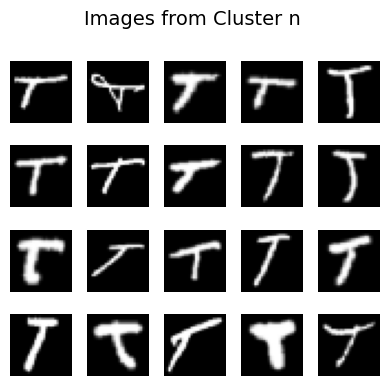

1


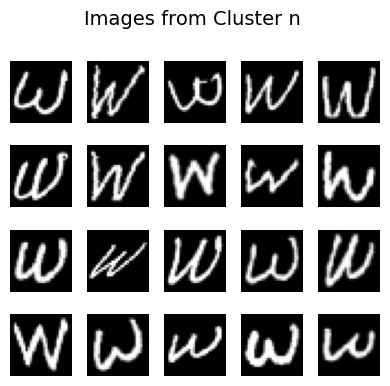

2


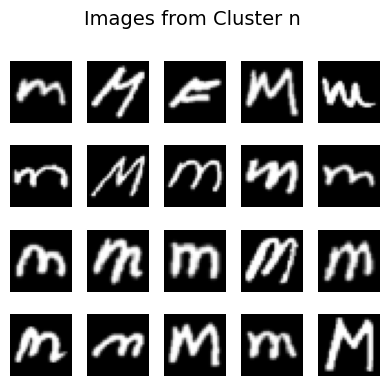

3


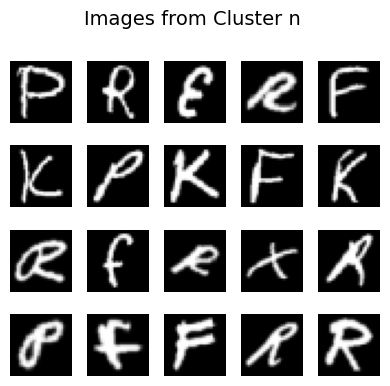

4


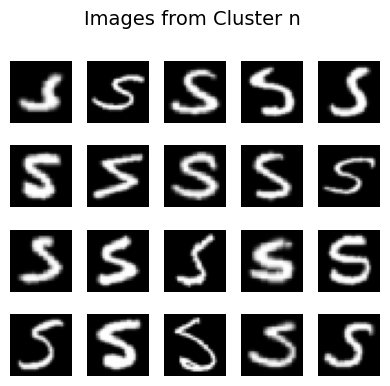

5


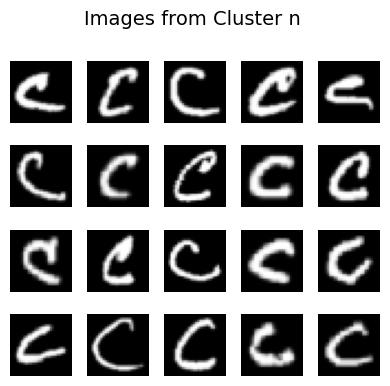

6


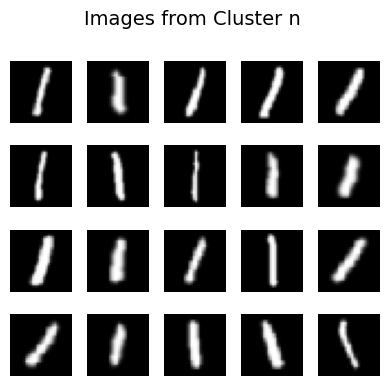

7


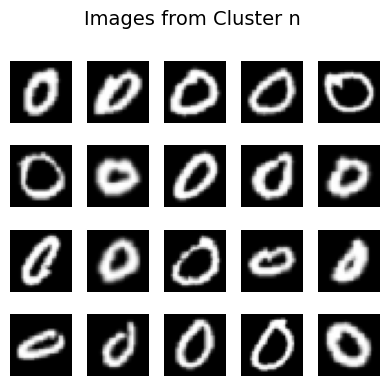

8


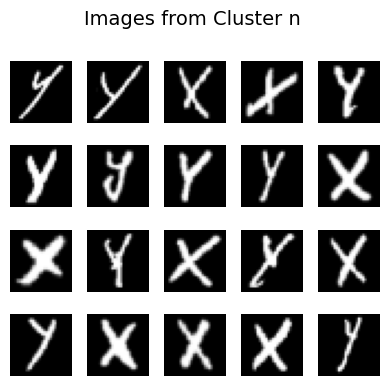

9


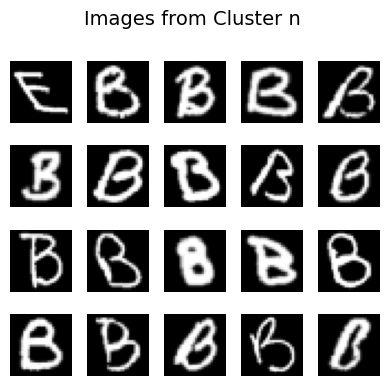

10


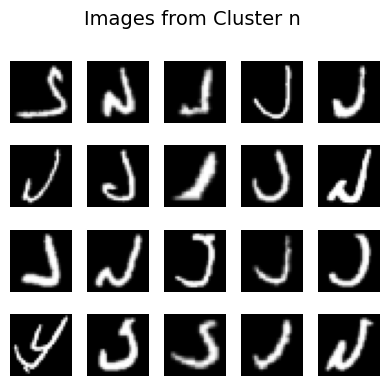

11


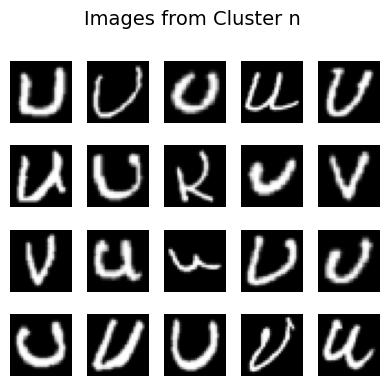

12


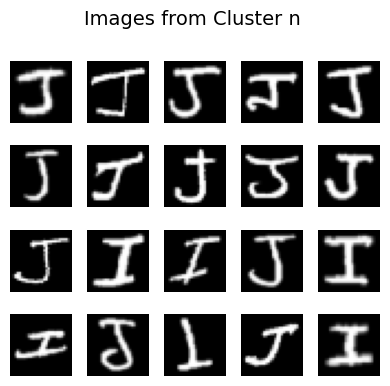

13


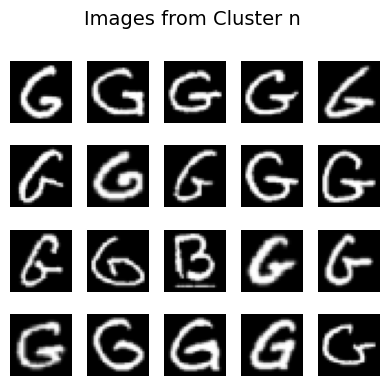

14


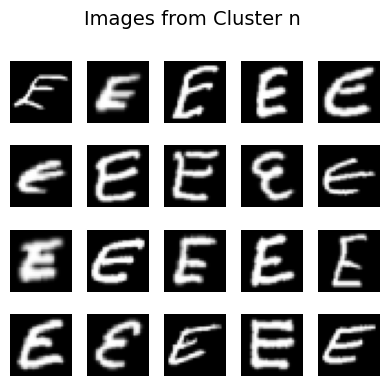

15


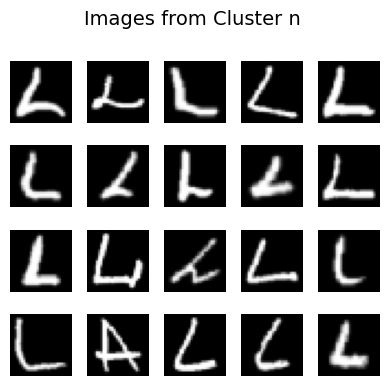

16


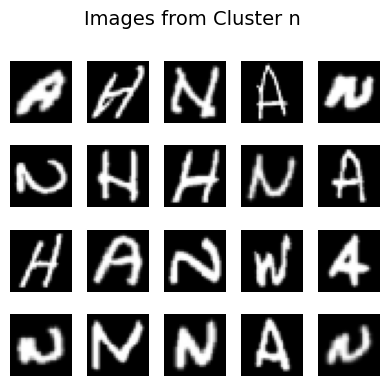

17


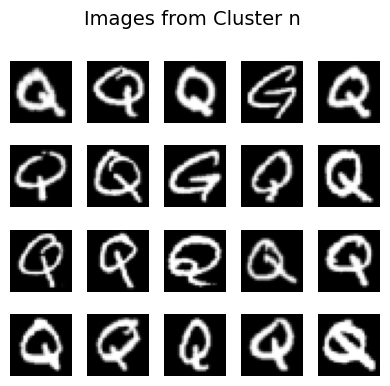

18


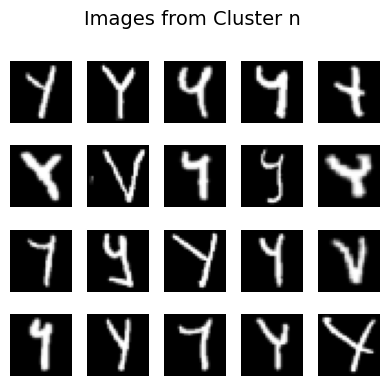

19


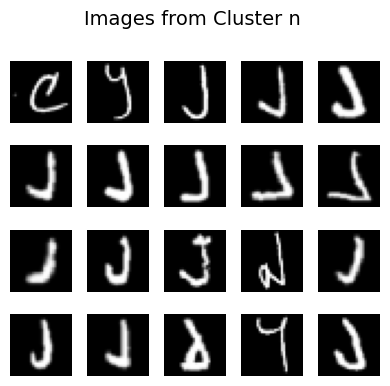

20


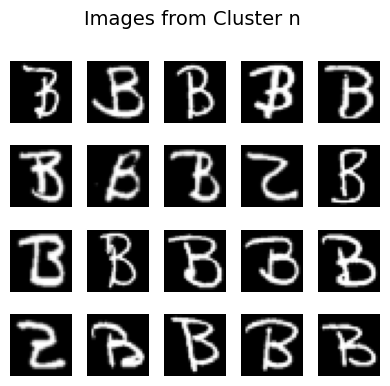

21


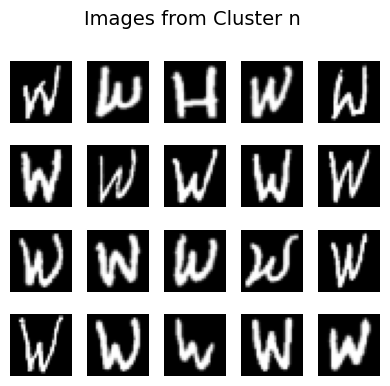

22


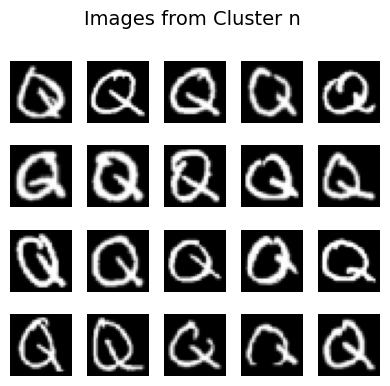

23
Cluster 0: 2690 data points
Noise: 2946 data points
Cluster 1: 9962 data points
Cluster 2: 4066 data points
Cluster 3: 8610 data points
Cluster 4: 24537 data points
Cluster 8: 30160 data points
Cluster 5: 20695 data points
Cluster 6: 10362 data points
Cluster 7: 10577 data points
Cluster 17: 18063 data points
Cluster 9: 7388 data points
Cluster 10: 2911 data points
Cluster 11: 717 data points
Cluster 12: 16163 data points
Cluster 13: 4256 data points
Cluster 15: 4502 data points
Cluster 14: 1979 data points
Cluster 16: 5114 data points
Cluster 18: 1653 data points
Cluster 20: 267 data points
Cluster 19: 773 data points
Cluster 22: 135 data points
Cluster 23: 99 data points
Cluster 21: 232 data points
Cluster 24: 101 data points


In [231]:
i = 2.5; k=100
dbscan2t = DBSCAN(eps=i, min_samples=k)
dbscan2t_result = dbscan2t.fit_predict(X_tsne2t)
plt.scatter(X_tsne2t[:, 0], X_tsne2t[:, 1], c=dbscan2t_result, cmap='rainbow')
plt.title('Clustering with PCA, t-SNE and DBSCAN')
plt.colorbar()
plt.show()
print(i, k)


# 각 클러스터의 이미지 출력
n = [i for i in range(-1, num_unique_elements-1)]
for i in n:
  image_show(w=dbscan2t_result, n=i, size=20, r=4, c=5)
  print(i)


# 각 클러스터에 포함된 데이터 개수 계산
from collections import Counter
cluster_counts = Counter(dbscan2t_result)
for label, count in cluster_counts.items():
    if label == -1:
        print(f"Noise: {count} data points")
    else:
        print(f"Cluster {label}: {count} data points")

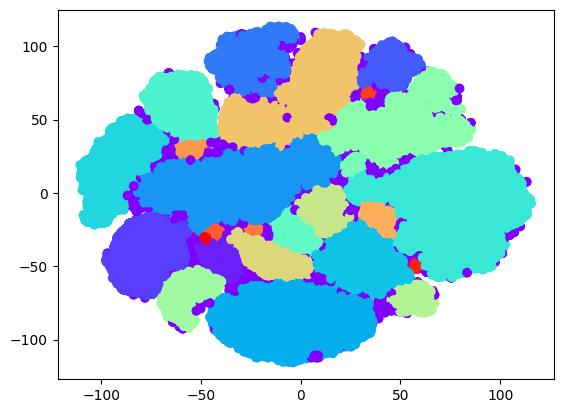

In [235]:
# 시각화
plt.scatter(X_tsne2t[:, 0], X_tsne2t[:, 1], c=dbscan2t_result, cmap='rainbow')

In [ ]:
from collections import Counter
# 각 클러스터에 포함된 데이터 개수 계산
cluster_counts = Counter(dbscan2t_result)

# 결과 출력
for label, count in cluster_counts.items():
    if label == -1:
        print(f"Noise: {count} data points")
    else:
        print(f"Cluster {label}: {count} data points")

Cluster 0: 162 data points
Noise: 854 data points
Cluster 1: 462 data points
Cluster 14: 817 data points
Cluster 2: 431 data points
Cluster 12: 367 data points
Cluster 7: 1505 data points
Cluster 19: 29 data points
Cluster 3: 1086 data points
Cluster 4: 601 data points
Cluster 5: 742 data points
Cluster 6: 186 data points
Cluster 8: 1167 data points
Cluster 18: 67 data points
Cluster 9: 698 data points
Cluster 10: 160 data points
Cluster 11: 77 data points
Cluster 13: 227 data points
Cluster 15: 230 data points
Cluster 17: 79 data points
Cluster 16: 53 data points


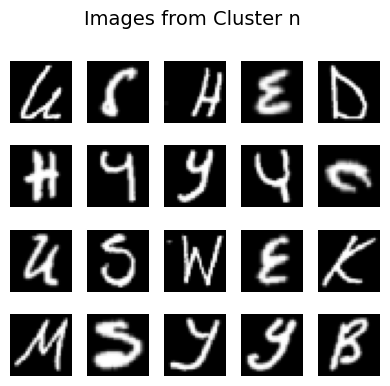

-1


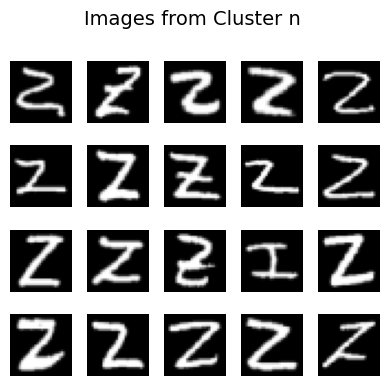

0


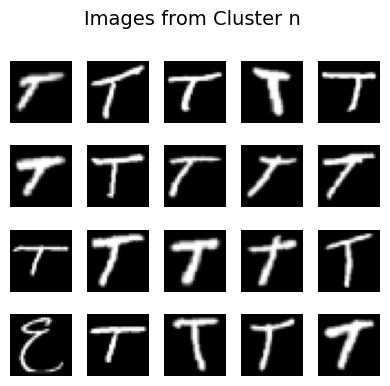

1


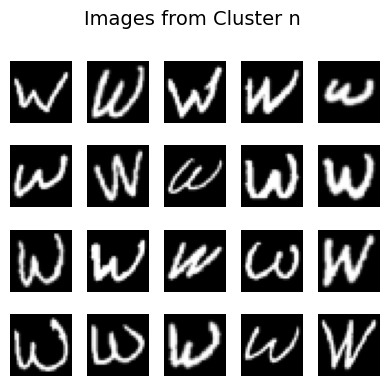

2


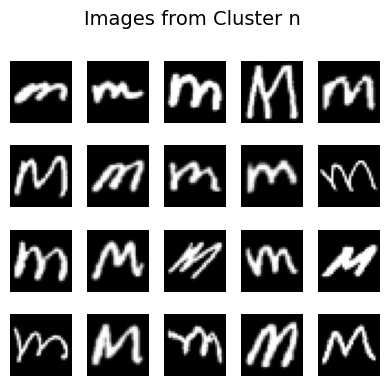

3


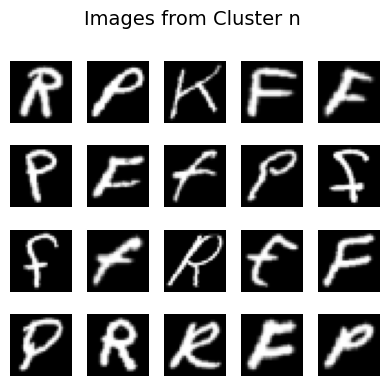

4


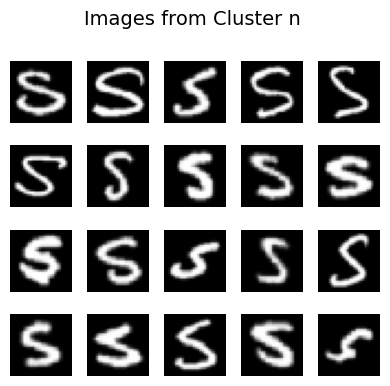

5


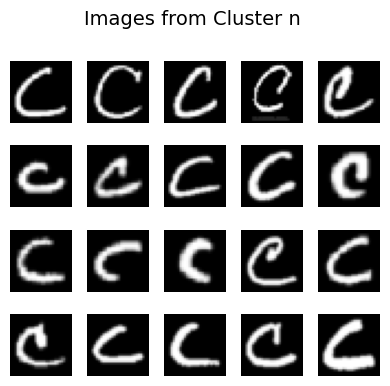

6


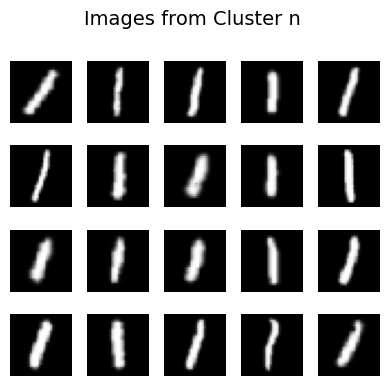

7


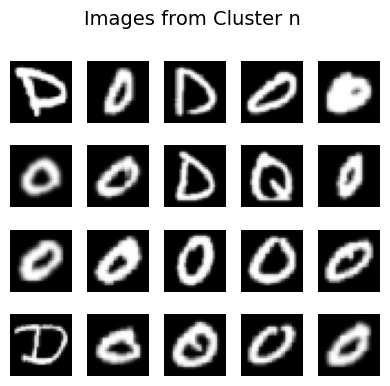

8


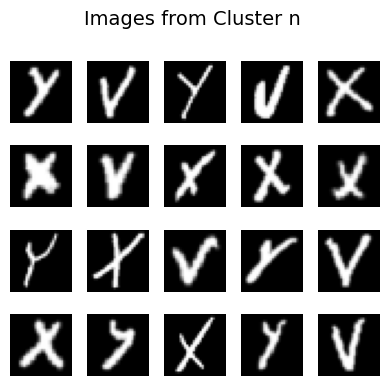

9


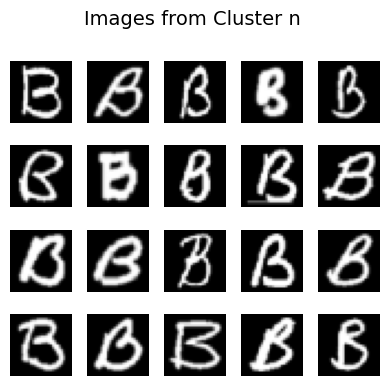

10


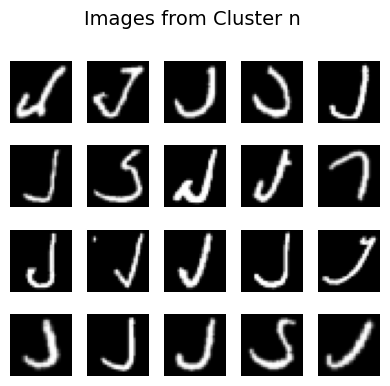

11


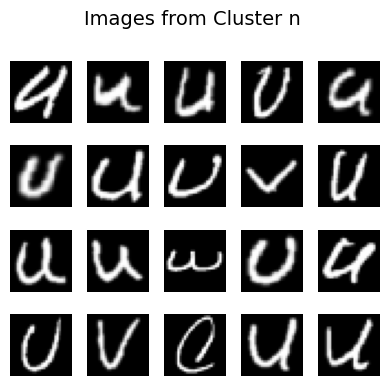

12


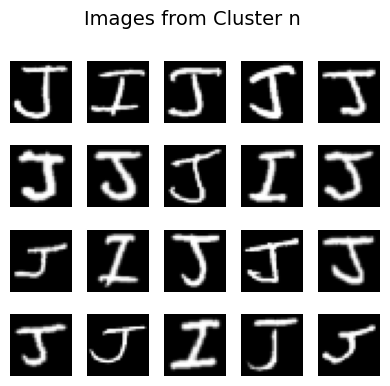

13


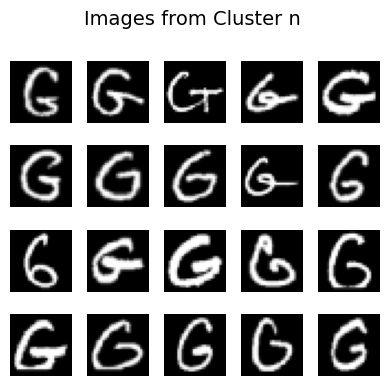

14


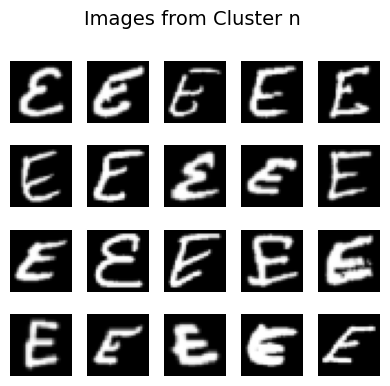

15


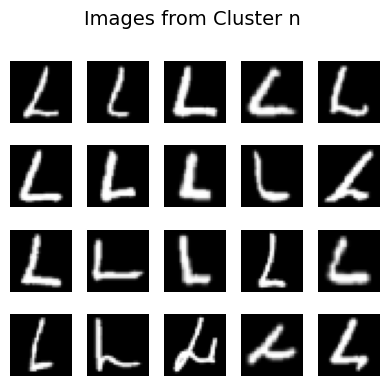

16


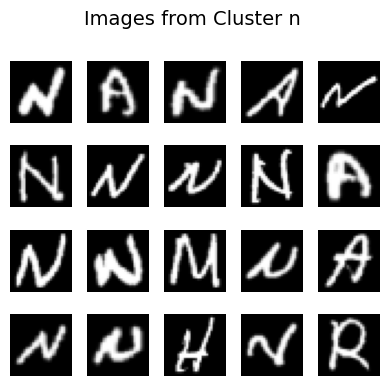

17


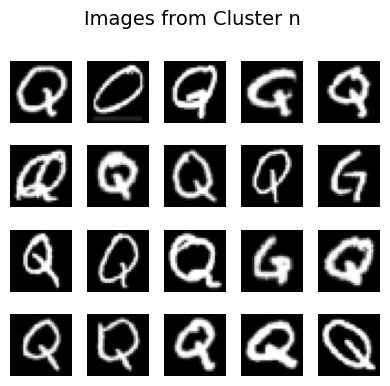

18


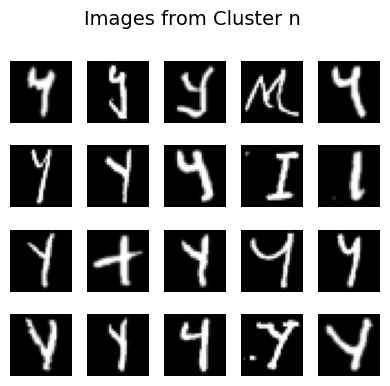

19


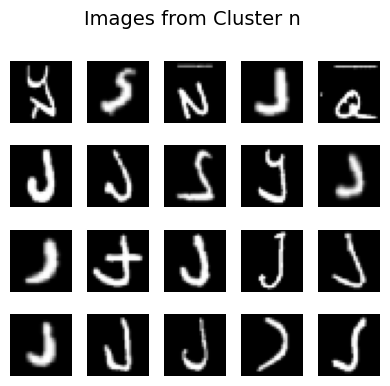

20


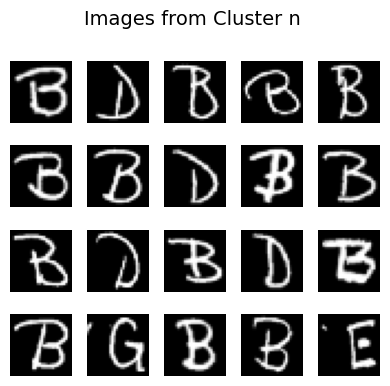

21


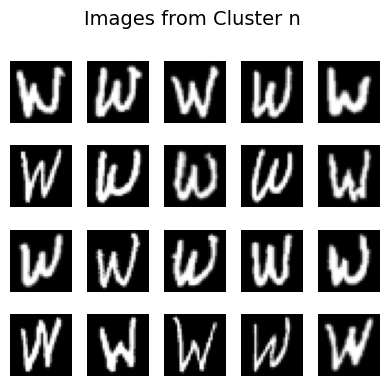

22


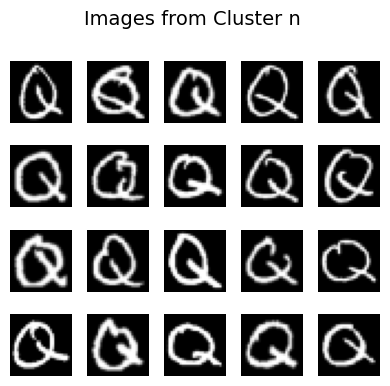

23


In [276]:
n = [i for i in range(-1, num_unique_elements-1)]
for i in n:
  image_show(w=dbscan2t_result, n=i, size=20, r=4, c=5)
  print(i)

# 결과

pca + t-SNE + DBSCAN 방법 이용

In [301]:
import pandas as pd
submission = pd.read_csv('/content/drive/MyDrive/bigdata_deeplearning/final/submission.csv')
submission.head()

,Unnamed: 0,target
0,1,A
1,2,A
2,3,A
3,4,A
4,5,A


In [302]:
submission.shape

(188958, 2)

In [303]:
dbscan2t_result

array([ 0, -1,  1, ..., 17, 10,  3])

In [304]:
submission['target'] = dbscan2t_result
submission

,Unnamed: 0,target
0,1,0
1,2,-1
2,3,1
3,4,2
4,5,3
...,...,...
188953,188954,8
188954,188955,2
188955,188956,17
188956,188957,10


In [305]:
cluster_num = [-1, 0, 1, 2, 3,
               4, 5, 6, 7, 8,
               9, 10, 11, 12, 13,
               14, 15, 16, 17, 18,
               19, 20, 21, 22, 23]

alphabet = ['', 'Z', 'T', 'W', 'M',
            'R', 'S', 'C', 'I', 'O',
            'X', 'B', 'V', 'U', 'J',
            'G', 'E', 'L', 'N', 'Q',
            'Y', 'J', 'B', 'W', 'Q']


In [298]:
len(cluster_num), len(alphabet)

(25, 25)

In [307]:
for i in range(len(cluster_num)):
  submission.loc[submission['target']==cluster_num[i], 'target']=alphabet[i]

In [308]:
submission

,Unnamed: 0,target
0,1,Z
1,2,
2,3,T
3,4,W
4,5,M
...,...,...
188953,188954,O
188954,188955,W
188955,188956,N
188956,188957,B


In [309]:
submission.to_csv('submission_hyojin.csv', index = False)